## Organize imports, labeling, visualization

In [66]:
import pandas as pd
import scipy.signal
import matplotlib.pyplot as plt
import numpy as np

# for downprojection through KDA:
# ! pip install pyDML
import dml

import glob
import os

import librosa
import math

In [67]:
label_dict = {'Grip1_screw': 1, 'Grip1_unscrew': 2, 'Grip2_screw': 3, 'Grip2_unscrew': 4}

In [68]:
def simple_visualizer(zyx_signal, position_second_one):
    plt.title('whole signal')
    plt.plot(zyx_signal)
    plt.show()
    
    plt.title('first three seconds of signal')
    plt.plot(zyx_signal[:position_second_one*3+1,:])
    plt.show()
    
    plt.title('first six seconds of signal')
    plt.plot(zyx_signal[:position_second_one*3*2+1,:])
    plt.show()
    
    return

## Pre-process signal

### Filter signal: butterworth

In [69]:
def butter_filtering(zyx_signal):
    
    butterworth = scipy.signal.butter(N=5, Wn=9, btype='low', analog=False, output='sos', fs=20)

    # for z-axis:
    filtered_signal_z = scipy.signal.sosfilt(butterworth, zyx_signal[:,0])
    # for y-axis:
    filtered_signal_y = scipy.signal.sosfilt(butterworth, zyx_signal[:,1])
    # for x-axis:
    filtered_signal_x = scipy.signal.sosfilt(butterworth, zyx_signal[:,2])

    plt.title('before and after filtering z')
    plt.plot(zyx_signal[:,0],label='original signal')
    plt.plot(filtered_signal_z,label='filtered signal')
    plt.legend()
    plt.show()

    plt.title('before and after filtering y')
    plt.plot(zyx_signal[:,1],label='original signal')
    plt.plot(filtered_signal_y,label='filtered signal')
    plt.legend()
    plt.show()

    plt.title('before and after filtering x')
    plt.plot(zyx_signal[:,2],label='original signal')
    plt.plot(filtered_signal_x,label='filtered signal')
    plt.legend()
    plt.show()    
    
    return filtered_signal_z, filtered_signal_y, filtered_signal_x

In [70]:
def namevar(obj, namespace):

    try:
        return [name for name in namespace if namespace[name] is obj][0], True
    except: 
        return obj, False

In [71]:
def arff_saver(label_mode, *kwargs):
    ''' append arff by one sample '''
    
    #arff_name = f'feat_arff/all_feat_label{kwargs[-1]}.arff' 
    arff_name = f'feat_arff/all_feat_{label_mode}.arff' 

    if not os.path.exists(arff_name):
        no_success_counter = 0
        no_success_list = ['XY_cross_product_per_window[0]', 'XY_cross_product_per_window[1]', 
                   'XZ_cross_product_per_window[0]', 'XZ_cross_product_per_window[1]', 
                   'YZ_cross_product_per_window[0]', 'YZ_cross_product_per_window[1]', 
                   'DC_per_window_z[0]', 'DC_per_window_z[1]', 
                   'Energy_per_window_z[0]', 'Energy_per_window_z[1]', 
                   'Entropy_per_window_z[0]', 'Entropy_per_window_z[1]',  
                   'DC_per_window_y[0]', 'DC_per_window_y[1]', 
                   'Energy_per_window_y[0]', 'Energy_per_window_y[1]', 
                   'Entropy_per_window_y[0]', 'Entropy_per_window_y[1]', 
                   'DC_per_window_x[0]', 'DC_per_window_x[1]', 
                   'Energy_per_window_x[0]', 'Energy_per_window_x[1]', 
                   'Entropy_per_window_x[0]', 'Entropy_per_window_x[1]' 
                   ]
        with open(arff_name, 'w') as f:
            
            f.write(('@relation firstset\n'))
            
            for feat in kwargs:
                
                a, success = namevar(feat, globals())
                
                if success and a != 'label' and a != '__' and a !='___':
                    
                    f.write((f'@attribute {a} real\n'))
                    
                elif not success and a != 'label':
                    
                    f.write((f'@attribute {no_success_list[no_success_counter]} real\n'))
                    no_success_counter += 1
                    
            f.write(('@attribute label {1,2}\n\n'))
                
            f.write('@data\n')
            

    with open(arff_name, 'a') as g:
       # g.write(f'1, ')

        for ind, feat in enumerate(kwargs):

            if ind == len(kwargs) - 1:
                g.write(f'{feat}\n')

            else:
                g.write(f'{feat}, ')
            
     
    return

## Extract features
Extract the features within the window!

In [72]:
def time_domain_Alldim(signal_z, signal_y, signal_x):
    
    # correlation between dimensions:
    XY = np.corrcoef(signal_x, signal_y)[0,1]
    XZ = np.corrcoef(signal_x, signal_z)[0,1]
    YZ = np.corrcoef(signal_y, signal_z)[0,1]
    
    return XY, XZ, YZ

In [73]:
def f_domain_feat_Onedim(stft_sig_dim):
    
    # mean:
    DC_per_window = abs(np.mean(stft_sig_dim, axis=0))
    DC_total = np.mean(DC_per_window)

    # energy:
    Energy_per_window = np.mean(abs(stft_sig_dim)**2, axis=0)
    Energy_total = np.mean(Energy_per_window)

    # information entropy:
    Entropy_per_window = np.zeros((stft_sig_dim.shape[1],))

    for t in range(stft_sig_dim.shape[1]):
        number_counts = np.bincount((np.round(abs(stft_sig_dim), 2)[:,t]*100).astype('int'))

        prob_list = []
        math_log = []
        for ind, count in enumerate(number_counts):

            if count != 0:
                p = count/stft_sig_dim.shape[0]
                prob_list.append(p)
                math_log.append(math.log(p, 2))

        Entropy_one_window = - np.sum(np.array(prob_list) * np.array(math_log))

        Entropy_per_window[t] = Entropy_one_window

    Entropy_total = np.mean(Entropy_per_window)

    return DC_per_window, DC_total, Energy_per_window, Energy_total, Entropy_per_window, Entropy_total

In [74]:
def f_domain_feat_Alldim(stft_z, stft_y, stft_x):
    
    # normalized cross product:
    XY = np.zeros((stft_z.shape))
    XZ = np.zeros((stft_z.shape))
    YZ = np.zeros((stft_z.shape))
    
    for ind_f, bin_z in enumerate(stft_z):
        
        for ind_bin, val_z in enumerate(bin_z):
    
            XY[ind_f, ind_bin] = (np.cross(np.array([0, 0, stft_x[ind_f, ind_bin]]), np.array([0, stft_y[ind_f, ind_bin], 0]))/3)[0]
            XZ[ind_f, ind_bin] = (np.cross(np.array([0, 0, stft_x[ind_f, ind_bin]]), np.array([stft_z[ind_f, ind_bin], 0, 0]))/3)[1]
            YZ[ind_f, ind_bin] = (np.cross(np.array([0, stft_y[ind_f, ind_bin], 0]), np.array([stft_z[ind_f, ind_bin], 0, 0]))/3)[2]

    XY_per_window = np.mean(XY, axis=0)
    XY_total = np.mean(XY_per_window)
    
    XZ_per_window = np.mean(XZ, axis=0)
    XZ_total = np.mean(XZ_per_window)
    
    YZ_per_window = np.mean(YZ, axis=0)
    YZ_total = np.mean(YZ_per_window)
    
    return XY_per_window, XZ_per_window, YZ_per_window, XY_total, XZ_total, YZ_total

## Bring all together

In [75]:
''' All signals have same number of STFT bins: 2
max_bin = 0

for file in glob.glob('dataset/*/*/Accelerometer.csv'):
    label_name = file.split('/')[-3]
    label = label_dict[label_name]
    
    zyx_pd = pd.read_csv(file, header=0)
    
    position_second_one = np.where(zyx_pd['seconds_elapsed'].to_numpy()>=1)[0][0]
    
    # Cut away the first and last five seconds of a signal:
    zyx_pd_cut = zyx_pd[position_second_one*4//10:(len(zyx_pd['z'].values)-position_second_one*4//10)]
    length_signal = zyx_pd_cut.shape[0]
    
    stft_z = librosa.stft(zyx_signal[:,0], hop_length=32, win_length=32, window='hann')

    if stft_z.shape[1] > max_bin:
        max_bin = stft_z.shape[1]
        
max_bin # 2
''';

In [78]:
label_mode = 'Task1'

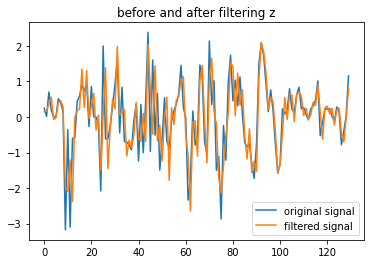

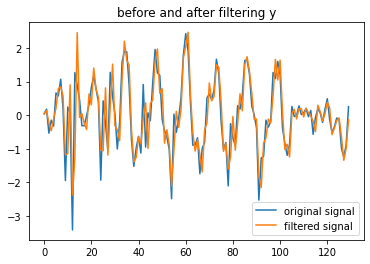

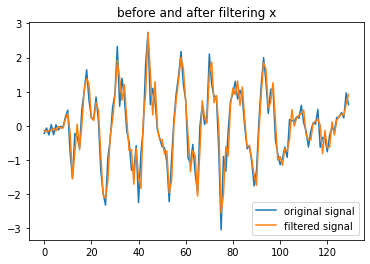

/home/c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: ComplexWarning: Casting complex values to real discards the imaginary part
  if sys.path[0] == "":
/home/c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: ComplexWarning: Casting complex values to real discards the imaginary part
  del sys.path[0]
/home/c/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: ComplexWarning: Casting complex values to real discards the imaginary part
  


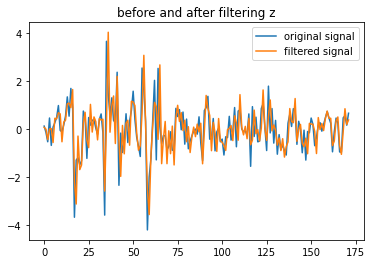

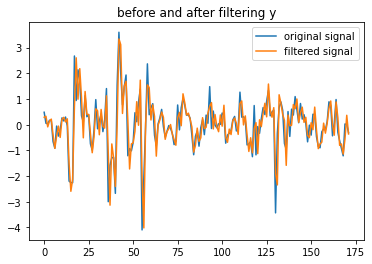

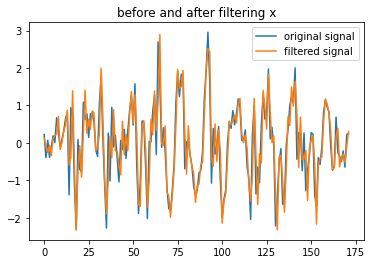

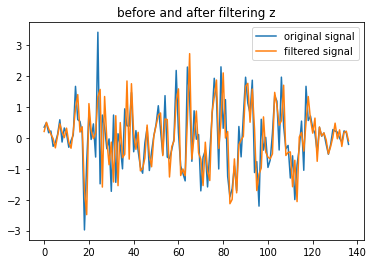

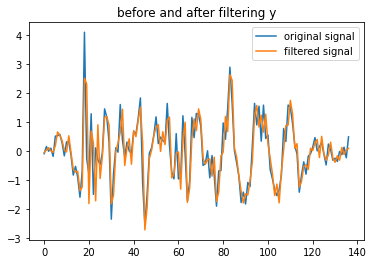

...

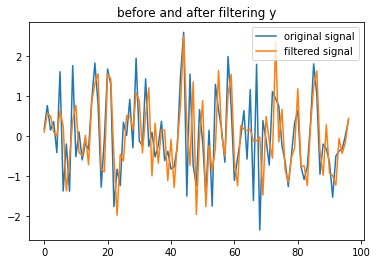

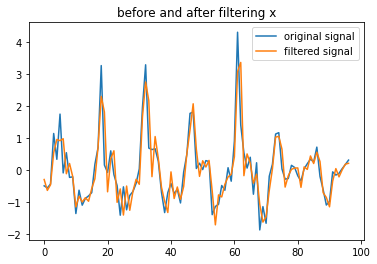

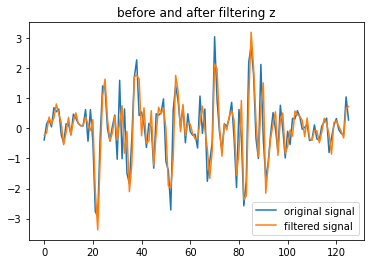

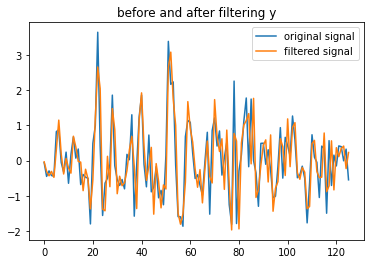

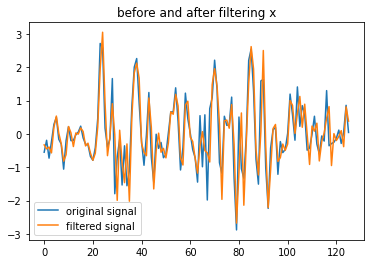

In [79]:
for file in glob.glob('dataset/*/*/Accelerometer.csv'):
    
    label_name = file.split('/')[-3]
    label = label_dict[label_name]
    
    if label_mode=='Task2':
        if label==2 or label==4:
            continue
        elif label==3:
            label=2
        

    if (label_mode=='Task1' and (label==1 or label==2)) or label_mode=='Task2':

        zyx_pd = pd.read_csv(file, header=0)

        position_second_one = np.where(zyx_pd['seconds_elapsed'].to_numpy()>=1)[0][0]

        # Cut away the first and last five seconds of a signal:
        zyx_pd_cut = zyx_pd[position_second_one*4//10:(len(zyx_pd['z'].values)-position_second_one*4//10)]
        zyx_signal = zyx_pd_cut.to_numpy()[:,-3:]

        # nomalize_values:
        zyx_signal[:,0] = (zyx_signal[:,0] - zyx_signal[:,0].mean())/zyx_signal[:,0].std()
        zyx_signal[:,1] = (zyx_signal[:,1] - zyx_signal[:,1].mean())/zyx_signal[:,1].std()
        zyx_signal[:,2] = (zyx_signal[:,2] - zyx_signal[:,2].mean())/zyx_signal[:,2].std()

        #simple_visualizer(zyx_signal, position_second_one)

        # filtering:
        filtered_signal_z, filtered_signal_y, filtered_signal_x = butter_filtering(zyx_signal)

        # feature extraction:
        # time domain:
        XY_correl, XZ_correl, YZ_correl = time_domain_Alldim(filtered_signal_z, filtered_signal_y, filtered_signal_x)

        # frequency domain:
        stft_z = librosa.stft(filtered_signal_z, hop_length=32, win_length=32, window='hann')
        stft_y = librosa.stft(filtered_signal_y, hop_length=32, win_length=32, window='hann')
        stft_x = librosa.stft(filtered_signal_x, hop_length=32, win_length=32, window='hann')

        DC_per_window_z, DC_total_z, Energy_per_window_z, Energy_total_z, Entropy_per_window_z, Entropy_total_z = f_domain_feat_Onedim(stft_z)
        DC_per_window_y, DC_total_y, Energy_per_window_y, Energy_total_y, Entropy_per_window_y, Entropy_total_y = f_domain_feat_Onedim(stft_y)
        DC_per_window_x, DC_total_x, Energy_per_window_x, Energy_total_x, Entropy_per_window_x, Entropy_total_x = f_domain_feat_Onedim(stft_x)

        XY_cross_product_per_window, XZ_cross_product_per_window, YZ_cross_product_per_window, XY_cross_product_total, XZ_cross_product_total, YZ_cross_product_total = f_domain_feat_Alldim(stft_z, stft_y, stft_x)

        arff_saver(label_mode, XY_correl, XZ_correl, YZ_correl, 
                   XY_cross_product_per_window[0], XY_cross_product_per_window[1], 
                   XZ_cross_product_per_window[0], XZ_cross_product_per_window[1], 
                   YZ_cross_product_per_window[0], YZ_cross_product_per_window[1], 
                   XY_cross_product_total, XZ_cross_product_total, YZ_cross_product_total, 
                   DC_per_window_z[0], DC_per_window_z[1], DC_total_z, 
                   Energy_per_window_z[0], Energy_per_window_z[1], Energy_total_z, 
                   Entropy_per_window_z[0], Entropy_per_window_z[1], Entropy_total_z, 
                   DC_per_window_y[0], DC_per_window_y[1], DC_total_y, 
                   Energy_per_window_y[0], Energy_per_window_y[1], Energy_total_y, 
                   Entropy_per_window_y[0], Entropy_per_window_y[1], Entropy_total_y, 
                   DC_per_window_x[0], DC_per_window_x[1], DC_total_x, 
                   Energy_per_window_x[0], Energy_per_window_x[1], Energy_total_x, 
                   Entropy_per_window_x[0], Entropy_per_window_x[1], Entropy_total_x, 
                   label)
        
        